# <span style="color:#336699">Mineração de Dados Aplicada - Aprendizado Não Supervisionado</span>
<hr style="border:2px solid #0077b9;">

<br/>

<div style="text-align: center;font-size: 90%;">
    Professora:
    <br/>
    Vanessa Cristina Oliveira de Souza
    <br/> <br/>
    Autor:
    <br/>
    Ivan Leoni Vilas Boas 
    <br/> <br/>
    Agradecimento Especial:
    <br/>
    Flávio Belizário da Silva Mota 
    <br/><br/>
    ²Universidade Federal de Itajubá (UNIFEI)
    <br/><br/>
    Contato: <a href="mailto:Ivanleoni30@unifei.edu.br">ivanleoni30@unifei.edu.br</a>
    <br/>
    26/10/2022
    <br>
</div>

<br/>

<div style="text-align: justify;  margin-left: 25%; margin-right: 25%;">
<b>Objetivo.</b> Esse caderno Jupyter tem como objetivo apresentar métodos práticos de utilização de algoritmos de aprendizado não supervisionado Kmeans no projeto de Investimento
</div>

# Segmentação de Investimentos com Aprendizado Não Supervisionado
<hr style="border:2px solid #0077b9;">

A segmentação nada mais é do que a divisão dos investimentos em segmentos.

Esses grupos possuem características em comum, o que irá facilitar o trabalho de indicação de investimentos e facilitando o relacionamento com os clientes para diversificarem a carteria com tipos de produtos diferentes, mas que se relacinam entre si


## Cenário do negócio
<hr style="border:2px solid #0077b9;">

Suponha que estamos trabalhando como analistas de dados para uma empresa de <b>corretoras e investimentos</b> e queremos segmentar os investimentos oferecidos para ajudar os gerentes a indicarem novos produtos de investimentos com base nessa segmentação. Portanto, economizaremos  tempo e facilitaremos o trabalho do gerente de modo que ele possa realizar mais acertos de indicações aos clientes conforme um grupo específico de produtos de investimentos selecionados.

Nesse exemplo, todos os dados foram coletados através de varios sites declarados na documentação 01.

## Carregando bibliotecas
<hr style="border:2px solid #0077b9;">

In [162]:
import numpy as np
import pandas as pd

# Bibliotecas gráficas
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

## Carregando e entendendo os dados
<hr style="border:2px solid #0077b9;">

In [163]:
uri = 'C:\\Users\\IVAN LEONI\\Desktop\\notebooks\\dataFim.csv'
df = pd.read_csv(uri, index_col=0)
df.head()

,id,name,trade_market,market_type,type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,fees,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,NOVO MERCADO,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,-0.012772,0.546089,-0.203219,-0.419996,0.075613,33.37
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,NOVO MERCADO,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,-0.601458,0.654105,-1.069647,-0.758763,0.088618,2.80
2,AESB3,AES BRASIL ENERGIA S.A.,NOVO MERCADO,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,-0.228653,0.292589,-1.117116,-0.368523,0.038853,10.20
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,BOLSA,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,0.066005,0.388282,-0.082924,-0.148004,0.056708,9.21
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,NOVO MERCADO,Ações,NaN,IBOV,Renda Variável,4.0,2,True,False,brokerage,Renda Variável,Público Geral,0.003454,0.614427,-0.154208,-0.445000,0.075715,8.75


### Limpeza dos dados 
<hr style="border:2px solid #0077b9;">

In [164]:
df.count()

id                     18431
name                   18431
trade_market           18431
market_type            18042
type                     389
benchmark              18042
strategy               18042
risk                   18042
liquidity              18431
has_periodic_income    18431
is_income_tax_free     18431
fees                    5891
market                 18431
investor               18431
return                 18422
volatility             18421
sharpe                 18421
max_dd                 18431
var                    18431
minimum_application    18431
dtype: int64

O atributo type apresenta 97% campos nulos e o restante é uma variavel constante de valor "BDR" e o atributo fees apresenta 68% de campos nulos, assim devido a variadade de atributos relevantes com dados completos completos e a grande quantidade de dados faltantes, optou-se por Remover da base de dados para se aproximar mais da realidade ao inves de completar os dados faltantes. O atributo nome sera removido pois não será relevante para a análiese e para a identificação será utilizado o id.

In [165]:
#del df['type','fees']
df.drop(columns=['name','type', 'fees'], axis = 1, inplace = True)

Uma informação importante que obtivemos a partir da exploração dos dados é que existiam valores repetidos do atributo ID. Vamos investigar esse atributo. Primeiramente, podemos verificar quantos são os valores únicos presentes nessa coluna:

In [166]:
df['id'].nunique()  # Verifica valores únicos na coluna

7106

 o valor acima indica que, dos 18431 registros resultantes 7106 possuem valor de ID único. Sabemos então que há uma duplicação de IDs. No entanto, em que quantidade? Um único ID está sendo duplicado várias vezes?

Para responder essas perguntas, vamos utilizar o método value_counts():

In [167]:
contagem_id = df['id'].value_counts() # Conta as ocorrências dos valores de uma coluna
contagem_id.head() # Exibe os 5 primeiros registros

IPCA-1.0-0.09    586
PRÉ-1.0-0.15     563
CDI-1.15-0.0     277
CDI-1.0-0.0      236
CDI-1.09-0.0     214
Name: id, dtype: int64

Assim, temos uma variável contagem_id que armazena o número de vezes que um ID apareceu no conjunto. Podemos repetir a operação, agora considerando essa variável, para obter a contagem dessas repetições:

In [168]:
contagem_id.value_counts() 

1      6113
2       250
3       129
4       127
5        73
       ... 
26        1
69        1
74        1
50        1
586       1
Name: id, Length: 80, dtype: int64

Com a saída anterior, podemos ver que varios IDs ocorrem mais de uma vez. Sendo assim, podemos criar uma máscara booleana para acessar os índices dos registros que possuem contagem maior que 1:

In [169]:
mascara_id_repetidos = contagem_id > 1 # Cria uma máscara lógica onde o valor de ocorrências for maior que 1
mascara_id_repetidos[0:10]

IPCA-1.0-0.09    True
PRÉ-1.0-0.15     True
CDI-1.15-0.0     True
CDI-1.0-0.0      True
CDI-1.09-0.0     True
CDI-1.06-0.0     True
CDI-1.04-0.0     True
CDI-1.12-0.0     True
CDI-1.02-0.0     True
CDI-1.08-0.0     True
Name: id, dtype: bool

Com a máscara criada, podemos selecionar os IDs que estão repetidos, para que possamos analisar esses registros:

In [170]:
ids_repetidos  = contagem_id.index[mascara_id_repetidos] # Retorna os IDs dos registros que estão na máscara
ids_repetidos  = list(ids_repetidos) # Converte para uma lista
len(ids_repetidos) # Verifica o tamanho da lista

993

A lista de IDs repetidos é de 993, o que corresponde a análise que fizemos anteriormente. Vamos utilizar essa lista para examinar os registros que possuem IDs repetidos

Utilizando apenas o primeiro ID da lista de repetidos, primeiro queremos encontrar as linhas que contêm esses IDs. Para isso, usamos o método isin(), que cria uma outra máscara lógica que pode ser usada no DataFrame para de fato exibir os registros que queremos, através do método .loc. Por fim, pedimos para ver as primeiras linhas do resultado dessa consulta:

In [171]:
df.loc[df['id'].isin(ids_repetidos[0:1]), :].head(20)


,id,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
6197,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,235,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1013.749729
6198,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,252,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1004.060983
6199,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,458,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1068.213170
6200,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,686,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1106.657242
6201,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,668,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1.324155
6202,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,598,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1227.174996
6203,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,203,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1.166347
6204,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,587,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1.112900
6205,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,371,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1100.166619
6206,IPCA-1.0-0.09,INVESTMENT BROKER,CDB,IPCA,Inflação,2.5,654,False,False,Renda Fixa,Público Geral,0.152537,0.003399,15.984629,0.0,-0.000108,1097.639550


Todos os atributos estão iguais, inclusive o id, principlamente para os de renda fixa. No entato o atributo liquidez que indica o numero de dias e o atributo minimum_application que representa o valor minimo de cada investimento são diferentes, resultando em registros portanto diferentes, sendo a liquidez e o valor minimo atributos diferenciais importantes no contesto de análise de investimento, assim sendo os ids seram renomeados para melhor identicaçaõ:

In [172]:
df["id"] =df.agg(lambda x: f"{x['id']}-{x['liquidity']}-{x['minimum_application']}", axis=1)


Repetindo o processo para verificar se ha repetição dos dados

In [173]:
df['id'].nunique()  # Verifica valores únicos na coluna

14342

In [174]:
contagem_id = df['id'].value_counts() # Conta as ocorrências dos valores de uma coluna
contagem_id.head() # Exibe os 5 primeiros registros

CDI-1.06-0.0-365-10000.0    59
CDI-1.0-0.0-60-10000.0      38
CDI-1.02-0.0-90-10000.0     28
CDI-1.05-0.0-365-10000.0    27
CDI-1.0-0.0-181-10000.0     27
Name: id, dtype: int64

In [175]:
contagem_id.value_counts() 

1     12492
2      1300
3       219
4       111
5        59
6        24
7        22
13       18
9        15
10       12
12       12
8        10
11        7
14        7
20        5
15        3
17        3
18        3
21        3
22        3
25        3
27        3
16        2
23        2
38        1
19        1
28        1
59        1
Name: id, dtype: int64

In [176]:
mascara_id_repetidos = contagem_id >=2 # Cria uma máscara lógica onde o valor de ocorrências for maior que 1
mascara_id_repetidos[0:10]

CDI-1.06-0.0-365-10000.0    True
CDI-1.0-0.0-60-10000.0      True
CDI-1.02-0.0-90-10000.0     True
CDI-1.05-0.0-365-10000.0    True
CDI-1.0-0.0-181-10000.0     True
CDI-1.01-0.0-90-10000.0     True
CDI-1.02-0.0-120-10000.0    True
CDI-1.04-0.0-182-10000.0    True
CDI-1.07-0.0-365-10000.0    True
CDI-1.05-0.0-721-10000.0    True
Name: id, dtype: bool

In [177]:
ids_repetidos  = contagem_id.index[mascara_id_repetidos] # Retorna os IDs dos registros que estão na máscara
ids_repetidos  = list(ids_repetidos) # Converte para uma lista
len(ids_repetidos) # Verifica o tamanho da lista

1850

In [178]:
df.loc[df['id'].isin(ids_repetidos[0:1]), :].head(20)

,id,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
11719,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11720,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11721,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11726,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11727,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11729,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11732,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11733,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11735,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0
11738,CDI-1.06-0.0-365-10000.0,INVESTMENT BROKER,CDB,CDI,Pós-Fixado,2.5,365,False,False,Renda Fixa,Qualificado,0.104392,0.001731,3.575706,0.0,-0.000203,10000.0


In [179]:
#df["id"] = df.agg(lambda x: f"{x['id']}-{x['volatility']}-{x['sharpe']}-{x['var']}", axis=1)

como pode ser obervado existe registros repetidos. Então a seguir serão excluidos os registros repetidos, mantendo apenas o ultimo.

In [180]:
df = df.drop_duplicates(subset=['id'],keep="last")

In [181]:
df.count()

id                     14342
trade_market           14342
market_type            13953
benchmark              13953
strategy               13953
risk                   13953
liquidity              14342
has_periodic_income    14342
is_income_tax_free     14342
market                 14342
investor               14342
return                 14334
volatility             14333
sharpe                 14333
max_dd                 14342
var                    14342
minimum_application    14342
dtype: int64

A seguir serma tratados os dados nulos. Tratrando os atributos com valores nulos

In [182]:
print(df.isnull().sum())

id                       0
trade_market             0
market_type            389
benchmark              389
strategy               389
risk                   389
liquidity                0
has_periodic_income      0
is_income_tax_free       0
market                   0
investor                 0
return                   8
volatility               9
sharpe                   9
max_dd                   0
var                      0
minimum_application      0
dtype: int64


In [183]:
# Inserindo dados novos nos campos nulos
df['market_type'].fillna('Outro', inplace=True)#cria categoria outro
df['benchmark'].fillna('Outro', inplace=True)#cria categoria outro
df['strategy'].fillna('Outro', inplace=True)#cria categoria outro
df['risk'].fillna('0', inplace=True)#sem risco
df['volatility'].fillna('0', inplace=True)#sem volatilidade
df['sharpe'].fillna('0', inplace=True)#Sem risco

#Inserindo o ultimo valor valido
df["return"].fillna(method='ffill', inplace=True)

In [184]:
print(df.isnull().sum())

id                     0
trade_market           0
market_type            0
benchmark              0
strategy               0
risk                   0
liquidity              0
has_periodic_income    0
is_income_tax_free     0
market                 0
investor               0
return                 0
volatility             0
sharpe                 0
max_dd                 0
var                    0
minimum_application    0
dtype: int64


In [185]:
df.count()

id                     14342
trade_market           14342
market_type            14342
benchmark              14342
strategy               14342
risk                   14342
liquidity              14342
has_periodic_income    14342
is_income_tax_free     14342
market                 14342
investor               14342
return                 14342
volatility             14342
sharpe                 14342
max_dd                 14342
var                    14342
minimum_application    14342
dtype: int64

### Descrição das variáveis
<hr style="border:2px solid #0077b9;">

<code>id</code>: identificação do Investimento </br></br>
<code>name</code>: Nome do investimento </br></br>
<code>trade_market</code>: Tipo de Mercado: 
<ul>
  <li> 0: CORRETOR DE INVESTIMENTOS (INVESTMENT BROKER) </li>
  <li> 1: BDR / CDA </li>
  <li> 2: BOLSA  </li>
  <li> 3: NOVO MERCADO </li>
  <li> 4: BOVESPA NIVEL 1 </li>
  <li> 5: BOVESPA NIVEL 2 </li>
  <li> 6: MAIS </li> 
</ul>
<code>market_type</code>: Tipo de Investimento
<ul>
  <li> 0: CDB </li>
  <li> 1: Fundo Multimercado </li>
  <li> 2: Fundo de Renda Fixa </li>
  <li> 3: LC </li> 
  <li> 4: Fundo de Ações </li>
  <li> 5: DEB </li>
  <li> 6: LCI </li> 
  <li> 7: CRA </li>
  <li> 8: Ações </li>
  <li> 9: FII </li>
  <li> 10: BDR </li>
  <li> 11: Fundo Cambial </li>
  <li> 12: FMP-FGTS </li>
  <li> 13: ATIVO REAL </li>
  <li> 14: CCB </li>
  <li> 15: CRI </li>
  <li> 16: LF </li>
  <li> 17: LCA </li>
  <li> 18: LIG </li>
  <li> 19: RDB </li>
  <li> 20: SUPER </li>
  <li> 21: LFSN </li>
  <li> 22: Outro </li>
</ul>
<code>benchmark:</code> Taxa referencial
<ul>
  <li> 0: IBOV </li>
  <li> 1: BDRX </li>
  <li> 2: IFIX </li>
  <li> 3: CDI </li>
  <li> 4: Outro </li>
  <li> 5: SELIC </li>
  <li> 6: IRFM </li>
  <li> 7: USD </li> 
  <li> 8: SMLL </li>
  <li> 9: PTAX </li>
  <li> 10: IEE </li>
  <li> 11: IBX </li>
  <li> 12: IDIV </li>
  <li> 13: IMA </li>
  <li> 14: EUR </li>
  <li> 15: ISE </li>
  <li> 16: IBSPM </li>
  <li> 17: IGC </li>
  <li> 18: PIB </li>
  <li> 19: IGCT </li>
  <li> 20: ICON </li>
  <li> 21: IFNC </li>
  <li> 22: IPCA </li>
  <li> 23: IMOB </li>
  <li> 24: SP500 </li>
  <li> 25: IGPM </li>
  <li> 26: IDI </li>
  <li> 27: IDKA </li>
  <li> 28: OURO </li>
  <li> 29: PTX </li>
  <li> 30: MSCI </li>
  <li> 31: PRÉ </li>
</ul>
<code>strategy</code>:Estatégia do investimento 
<ul>
  <li> 0: Renda Variável </li>
  <li> 1: Internacional </li>
  <li> 2: Alternativo </li>
  <li> 3: Outro </li>
  <li> 4: Pós-Fixado </li>
  <li> 5: Multimercado </li>
  <li> 6: Moeda </li>
  <li> 7: Inflação </li> 
  <li> 8: Pré-Fixado </li>
</ul>
<code>risk</code>: Risco do investimento varia de 0 ate 5, quanto maior o numero maior o risco</br>
<code>liquidity</code>: Liquidez do investimento: representa numero de dias para o resgate. Varia de 0 a 8765 dias</br></br>
<code>has_periodic_income</code>: Apresenta ou não periodicidade no rendimento</br>
<ul>
  <li> 0: sem rendimento por periodo (False) </li>
  <li> 1: com rendimento por periodo (True) </li>
</ul>
<code>is_income_tax_free</code>: Apresenta ou não IR 
<ul>
  <li> 0: sem IR (False) </li>
  <li> 1: com IR (True) </li>
</ul>
<code>fees</code>: Apresenta ou não taxas 
<ul>
  <li> 0: sem taxas (NaN) </li>
  <li> 1: com taxas </li>
</ul>
<code>market</code>: Mercado 
<ul>
  <li> 0: Renda Variável </li>
  <li> 1: Fundo de Investimento </li>
  <li> 2: Renda Fixa </li>
</ul>
<code>investidor</code>: 
<ul>
  <li> 0: Público Geral </li>
  <li> 1: Qualificado </li>
  <li> 2: Profissional </li>
</ul>
<code>return</code>: valor da taxa de retorno do investimento. Varia de -0.9998972988 ate 850.29 </br></br>
<code>volatility</code>: valor da volatilidade do investimento. Varia de 0 ate 27.50 </br></br>
<code>sharpe</code>: indice Sharpe avalia, além da rentabilidade, o risco de um investimento. É fundamental para mensurar o quanto de retorno excedente em relação a um ativo livre de risco é compensado através de seu nível de risco. Varia de  -300671.47 (ou abixo) ate 547.84</br></br>
<code>max_dd</code>: O Máximo Drawdown, também chamado de MDD ou reduções máximas, é a perda máxima observada de um pico até o vale de uma carteira — antes que outro pico seja atingido. Ele, então, é considerado como um indicador de risco de baixa ao longo de um determinado período. Varia de -1 a 0  </br></br>
<code>var</code>: O Value at Risk é um indicador de risco que estima a perda potencial máxima de um investimento para um período de tempo, com um determinado intervalo de confiança. Ou seja, através de um cálculo estatístico, o VaR mostra a exposição ao risco financeiro que um ou mais ativos possuem em determinado dia, semana ou mês. Varia de -0.0005674407813 ate 0.4516746435 </br> </br>
<code>minimum_application</code>: Valor minimo para uma aplicação varia de 0 ate 100.000.000</br></br>


### Tratamento dos atributos categóricos
<hr style="border:2px solid #0077b9;">

Conversão de dados categóricos em dados binários : has_periodic_income e is_income_tax_free 

In [187]:
df['has_periodic_income'].value_counts()

False    13378
True       964
Name: has_periodic_income, dtype: int64

In [188]:
df['has_periodic_income_CAT'] = 'none'
df[['has_periodic_income','has_periodic_income_CAT']].head(10)
map_categorias_has = {
    True:'Com rendimento por periodo',
    False:'Sem rendimento por periodo',
}
df['has_periodic_income_CAT'] = df['has_periodic_income'].map(map_categorias_has)
#df[['has_periodic_income','has_periodic_income_CAT']].head(10)
has_ohe = pd.get_dummies(df['has_periodic_income_CAT'])
#has_ohe.head(10)
has_ohe = pd.concat([df, has_ohe], axis=1)
#has_ohe[['has_periodic_income_CAT','Com rendimento por periodo', 'Sem rendimento por periodo']].head(10)

In [189]:
df['is_income_tax_free'].value_counts()

False    11868
True      2474
Name: is_income_tax_free, dtype: int64

In [190]:
df['is_income_tax_free_CAT'] = 'none'
map_categorias_ir = {
    True:'Com IR',
    False:'Sem IR',
}
df['is_income_tax_free_CAT'] = df['is_income_tax_free'].map(map_categorias_ir)
#df[['is_income_tax_free','is_income_tax_free_CAT']].head(10)
ir_ohe = pd.get_dummies(df['is_income_tax_free_CAT'])
#ir_ohe.head(10)
ir_ohe = pd.concat([df, ir_ohe], axis=1)
#ir_ohe[['is_income_tax_free_CAT', 'Com IR', 'Sem IR']].head(10)

Conversão de dados categóricos em valores numéricos : trade_market, market_type, benchmark, strategy, market e investor

In [191]:
df['trade_market'].replace(['INVESTMENT BROKER','BDR / CDA', 'BOLSA','NOVO MERCADO','BOVESPA NIVEL 1', 'BOVESPA NIVEL 2', 'MAIS'],[0,1,2,3,4,5,6], inplace=True)
df['market_type'].replace(['CDB','Fundo Multimercado', 'Fundo de Renda Fixa', 'LC', 'Fundo de Ações', 'DEB', 'LCI', 'CRA', 'Ações','FII', 'BDR', 'Fundo Cambial', 
                           'FMP-FGTS', 'ATIVO REAL', 'CCB', 'CRI', 'LF', 'LCA', 'LIG', 'RDB', 'SUPER', 'LFSN', 'Outro'], 
                          [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22],inplace=True)
df['benchmark'].replace(['IBOV', 'BDRX', 'IFIX', 'Outro', 'CDI', 'SELIC', 'IRFM', 'USD','SMLL', 'PTAX', 'IEE', 'IBX', 'IDIV', 'IMA', 'EUR', 'ISE', 'IBSPM','IGC', 'PIB', 'IGCT', 'ICON', 'IFNC', 
                         'IPCA', 'IMOB', 'SP500', 'IGPM', 'IDI', 'IDKA', 'OURO', 'PTX', 'MSCI', 'PRÉ'], [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31],inplace=True)
df['strategy'].replace(['Renda Variável', 'Internacional', 'Alternativo', 'Outro', 'Pós-Fixado', 'Multimercado', 'Moeda', 'Inflação', 'Pré-Fixado'],
                        [0,1,2,3,4,5,6,7,8],inplace=True)                      
df['market'].replace(['Renda Variável', 'Fundo de Investimento', 'Renda Fixa'],[0,1,2],inplace=True)
df['investor'].replace(['Público Geral', 'Qualificado', 'Profissional'],[0,1,2],inplace=True)

Uma transformação necessária na base sera a conversão do tipo,ma vez que foram importadas pelo pandas atributos como um object ou booleanos. Podemos usar o método astype() do pandas para isso:

In [192]:
df.dtypes

id                          object
trade_market                 int64
market_type                  int64
benchmark                    int64
strategy                     int64
risk                        object
liquidity                    int64
has_periodic_income           bool
is_income_tax_free            bool
market                       int64
investor                     int64
return                     float64
volatility                  object
sharpe                      object
max_dd                     float64
var                        float64
minimum_application        float64
has_periodic_income_CAT     object
is_income_tax_free_CAT      object
dtype: object

In [193]:
df['has_periodic_income'] = df['has_periodic_income'].astype('int64')
df['is_income_tax_free'] = df['is_income_tax_free'].astype('int64')

df['risk'] = df['risk'].astype('float64')
df['sharpe'] = df['sharpe'].astype('float64')
df['volatility'] = df['volatility'].astype('float64')

Os atributos 'id', 'has_periodic_income_CAT','is_income_tax_free_CAT' podem ser removidos para fazer a análise pelo kmeans

In [194]:
df = df.drop(columns=['id', 'has_periodic_income_CAT','is_income_tax_free_CAT'])

In [195]:
df.describe()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
count,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,14342.000000,1.434200e+04,14342.000000,1.434200e+04,14342.000000,14342.000000,1.434200e+04
mean,0.128713,3.655348,13.647330,5.164970,2.763980,681.664342,0.067215,0.172500,1.528657,0.338098,inf,0.072629,-inf,-0.064080,0.008923,7.540720e+04
std,0.541068,5.604379,11.960299,2.498332,1.141864,949.227664,0.250403,0.377828,0.619383,0.492858,NaN,0.324541,NaN,0.139522,0.021056,1.377601e+06
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-9.998973e-01,0.000000,-inf,-1.000000,-0.000567,0.000000e+00
25%,0.000000,0.000000,4.000000,4.000000,2.500000,3.000000,0.000000,0.000000,1.000000,0.000000,8.468087e-02,0.001469,-6.311050e-01,-0.036173,-0.000221,5.000000e+02
50%,0.000000,1.000000,4.000000,5.000000,2.500000,346.000000,0.000000,0.000000,2.000000,0.000000,1.118322e-01,0.003386,4.096114e+00,0.000000,-0.000043,1.107385e+03
75%,0.000000,5.000000,22.000000,7.000000,3.500000,1095.000000,0.000000,0.000000,2.000000,1.000000,1.284432e-01,0.046743,1.598463e+01,0.000000,0.006374,1.000000e+04
max,6.000000,22.000000,31.000000,8.000000,5.000000,8765.000000,1.000000,1.000000,2.000000,2.000000,inf,27.508523,5.478424e+02,0.000000,0.451675,1.000000e+08


Trata os dados com os valores inferiores e superiores 

In [196]:
df =df[~df.isin([np.nan, np.inf, -np.inf]).any(1)]
df.describe()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
count,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,14326.000000,1.432600e+04
mean,0.128857,3.652869,13.658383,5.166550,2.765671,681.671646,0.067290,0.172693,1.528200,0.338475,0.179669,0.072710,-107.028473,-0.064152,0.008930,7.496788e+04
std,0.541353,5.606993,11.962356,2.499069,1.140921,949.692208,0.250533,0.377995,0.619526,0.493004,8.912324,0.324713,2968.917509,0.139583,0.021062,1.378254e+06
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.999897,0.000000,-300671.475973,-1.000000,-0.000567,0.000000e+00
25%,0.000000,0.000000,4.000000,4.000000,2.500000,3.000000,0.000000,0.000000,1.000000,0.000000,0.084913,0.001469,-0.625410,-0.036204,-0.000221,5.000000e+02
50%,0.000000,1.000000,4.000000,5.000000,2.500000,341.500000,0.000000,0.000000,2.000000,0.000000,0.111903,0.003386,4.125205,0.000000,-0.000044,1.106920e+03
75%,0.000000,5.000000,22.000000,7.000000,3.500000,1095.000000,0.000000,0.000000,2.000000,1.000000,0.128459,0.046951,15.984629,0.000000,0.006378,1.000000e+04
max,6.000000,22.000000,31.000000,8.000000,5.000000,8765.000000,1.000000,1.000000,2.000000,2.000000,850.297076,27.508523,547.842429,0.000000,0.451675,1.000000e+08


In [197]:
df.head(10)

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
0,3,8,0,0,4.0,2,1,0,0,0,-0.012772,0.546089,-0.203219,-0.419996,0.075613,33.37
1,3,8,0,0,4.0,2,1,0,0,0,-0.601458,0.654105,-1.069647,-0.758763,0.088618,2.80
2,3,8,0,0,4.0,2,1,0,0,0,-0.228653,0.292589,-1.117116,-0.368523,0.038853,10.20
3,2,8,0,0,4.0,2,1,0,0,0,0.066005,0.388282,-0.082924,-0.148004,0.056708,9.21
4,3,8,0,0,4.0,2,1,0,0,0,0.003454,0.614427,-0.154208,-0.445000,0.075715,8.75
5,2,8,0,0,4.0,2,1,0,0,0,-0.173156,0.486187,-0.558138,-0.236148,0.077840,6.75
6,3,8,0,0,4.0,2,1,0,0,0,-0.274977,0.370787,-1.006454,-0.386355,0.048772,18.94
7,3,8,0,0,4.0,2,1,0,0,0,-0.624164,0.642822,-1.123743,-0.694373,0.091388,10.67
8,3,8,0,0,4.0,2,1,0,0,0,-0.527181,0.814209,-0.768088,-0.808333,0.092193,2.76
9,4,8,0,0,4.0,2,1,0,0,0,-0.650981,0.484986,-1.544756,-0.696922,0.069151,17.17


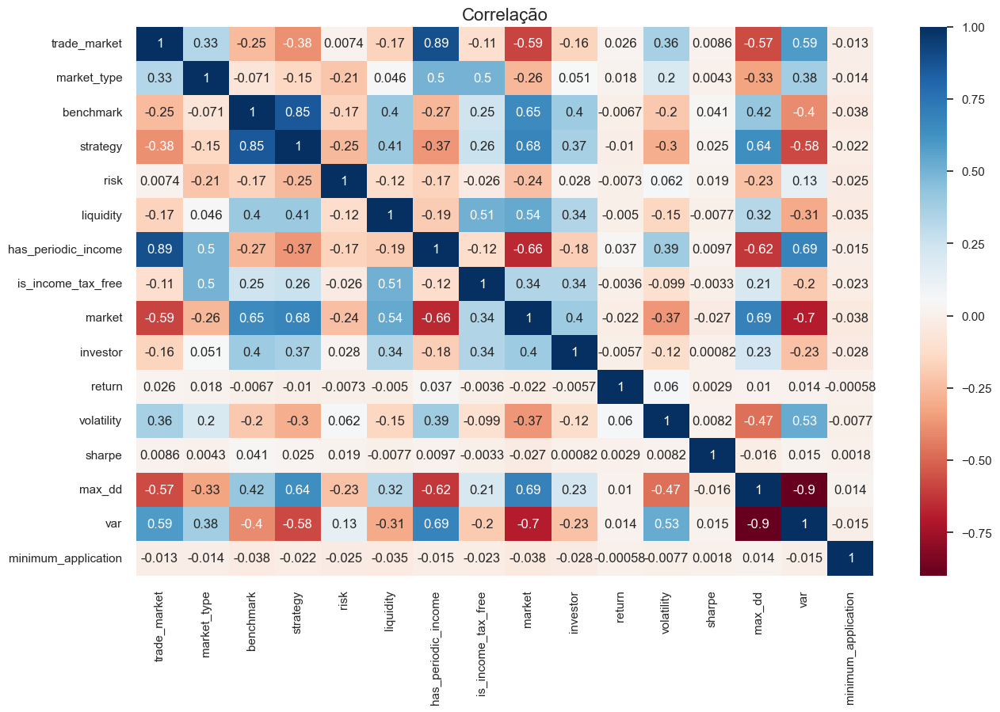

In [198]:
df.corr()
plt.figure(figsize=(15,9))
sns.heatmap(df.corr(),annot=True,cmap='RdBu')
plt.title('Correlação',fontsize=16)
plt.yticks(rotation =0)
plt.show()

## Padronizando os dados
<hr style="border:2px solid #0077b9;">

In [199]:
pip install sklearn

Note: you may need to restart the kernel to use updated packages.


In [200]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_std = scaler.fit_transform(df)
df_std = pd.DataFrame(data=df_std, columns=df.columns)
df_std.index=df.index
df_std.head()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
0,5.303827,0.775332,-1.14182,-2.067462,1.081909,-0.715701,3.723036,-0.456882,-2.466813,-0.686581,-0.021593,1.457889,0.035982,-2.549417,3.166101,-0.054371
1,5.303827,0.775332,-1.14182,-2.067462,1.081909,-0.715701,3.723036,-0.456882,-2.466813,-0.686581,-0.087649,1.790552,0.035691,-4.976487,3.783609,-0.054393
2,5.303827,0.775332,-1.14182,-2.067462,1.081909,-0.715701,3.723036,-0.456882,-2.466813,-0.686581,-0.045817,0.677174,0.035675,-2.180645,1.420752,-0.054388
3,3.456540,0.775332,-1.14182,-2.067462,1.081909,-0.715701,3.723036,-0.456882,-2.466813,-0.686581,-0.012754,0.971883,0.036023,-0.600750,2.268500,-0.054389
4,5.303827,0.775332,-1.14182,-2.067462,1.081909,-0.715701,3.723036,-0.456882,-2.466813,-0.686581,-0.019773,1.668353,0.035999,-2.728556,3.170976,-0.054389


## Como definir a quantidade de grupos do K-Means?
<hr style="border:2px solid #0077b9;">

O número de grupos pode ser um chute. Mas existem formas de encontrar um valor k que seja próximo do ideal. Uma das técnicas mais utilizadas é a técnica do cotovelo.

A ideia é treinar vários modelos do K-means com valores diferentes de k. Depois, gerar um gráfico mostrando o valor de inércia (WCSS, Within Clusters Sum of Squares) do modelo pelo número de k grupos. 

Aqueles valores no "cotovelo" do gráfico são possivelmente os melhores valores de k.

In [203]:
# importar o K-means
from sklearn.cluster import KMeans

wcss = []
for i in range(1,11):
    # inserir chamada ao K-means
    kmeans = KMeans(n_clusters=i, random_state=42)
    # agrupar
    kmeans.fit(df)
    # salvar resultado
    wcss.append(kmeans.inertia_)

O trecho de código a seguir exibe o gráfico:

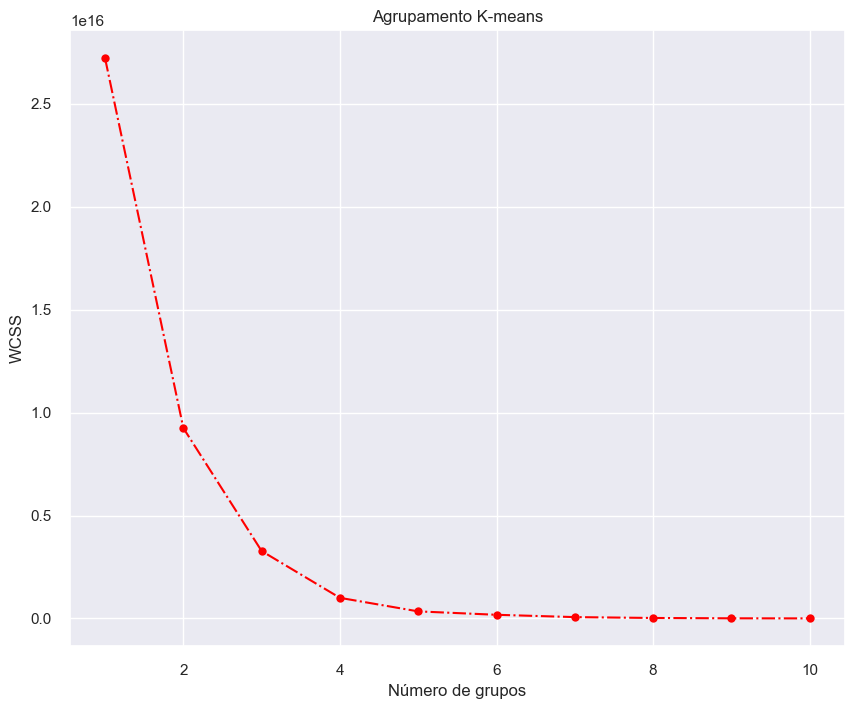

In [204]:
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Número de grupos')
plt.ylabel('WCSS')
plt.title('Agrupamento K-means')
plt.show()

## Agrupando com K-means
<hr style="border:2px solid #0077b9;">

In [205]:
# Crie uma variável 'n_clusters' que vai servir de parâmetro do K-means
# Defina a chamada ao método
# Agrupe

n_cluster=3
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
kmeans.fit(df_std)

KMeans(n_clusters=3, random_state=42)

## Determinando os segmentos
<hr style="border:2px solid #0077b9;">

Vamos associar cada rótulo de grupo gerado pelo K-means na etapa anterior ao seu registro equivalente:

In [206]:
df_segm_kmeans = df.copy()
df_segm_kmeans = pd.DataFrame(data = df, columns = df.columns)
df_segm_kmeans['Segmento K-means'] = kmeans.labels_ # Qual atributo do modelo me informa os rótulos?
df_segm_kmeans.head()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,Segmento K-means
0,3,8,0,0,4.0,2,1,0,0,0,-0.012772,0.546089,-0.203219,-0.419996,0.075613,33.37,2
1,3,8,0,0,4.0,2,1,0,0,0,-0.601458,0.654105,-1.069647,-0.758763,0.088618,2.80,2
2,3,8,0,0,4.0,2,1,0,0,0,-0.228653,0.292589,-1.117116,-0.368523,0.038853,10.20,2
3,2,8,0,0,4.0,2,1,0,0,0,0.066005,0.388282,-0.082924,-0.148004,0.056708,9.21,2
4,3,8,0,0,4.0,2,1,0,0,0,0.003454,0.614427,-0.154208,-0.445000,0.075715,8.75,2


Agora que temos os rótulos de grupo de cada registros, podemos analisar esses registros por grupo considerando uma métrica. Qual poderia ser essa métrica?

In [207]:
df_segm_analise = df_segm_kmeans.groupby(['Segmento K-means'])
investimentos = df_segm_analise.size()
df_segm_analise = df_segm_analise.mean() # Inserir a métrica necessária = média
df_segm_analise['investimentos'] = investimentos
df_segm_analise.head()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Segmento K-means,,,,,,,,,,,,,,,,,
0,0.000000,1.817974,4.028941,3.568926,3.119726,228.837319,0.00000,0.007464,1.265956,0.137243,0.054729,0.076987,-173.985922,-0.081697,0.010283,156095.147067,6565
1,0.000000,3.958309,24.678992,7.201679,2.524529,1217.049646,0.00000,0.357248,1.999558,0.581025,0.124300,0.001783,-57.675565,-0.000103,-0.000256,7205.881672,6788
2,1.897225,13.902364,1.746146,1.748201,2.059096,2.032888,0.99075,0.000000,0.009250,0.004111,1.408934,0.538664,0.441328,-0.392602,0.063882,320.370832,973


Podemos gerar um gráfico para analisar os valores de cada atributo por grupo:

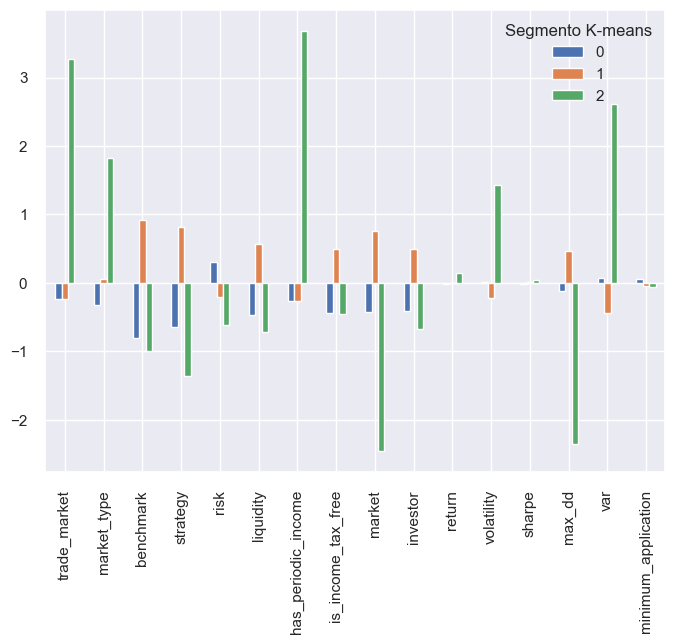

In [208]:
fig, ax = plt.subplots(figsize=(8,6))
df_segm_kmeans_std = df_std.copy()
df_segm_kmeans_std = pd.DataFrame(data = df_std, columns = df_std.columns)
df_segm_kmeans_std['Segmento K-means'] = kmeans.labels_ # Atributo do modelo que informa os grupos
df_segm_kmeans_std.groupby(['Segmento K-means']).mean().T.plot.bar(ax=ax) # Métrica de análise dos grupos
plt.show()

Podemos então definir os grupos considerando essas informações. Analise as informações que tem e tente dar nome a cada um dos grupos gerados:

In [209]:
df_segm_analise.rename({0:'INVESTMENT BROKER - Fundo Multimercado - Selic - Multimercado - sem risco - 523 dias - sem rendimento peridodico - Sem IR - Renda variavel/Fundo de invetimento - publico em geral - R-0,092 - baixa voltilidade e sharp - aceita perda minima - inic:77887 ',
                        1:' BDR/CDA/BOLSA - CCB - BDRX - Renda Variável/Alternativo - risco baixo - 2 dias - Com rendimento peridodico - Sem IR - Renda variável - publico em geral - R-1.42 - baixa voltilidade e sharp - aceita uma perda maior, mas mìnima- inic:219 ', 
                        2:'INVESTMENT BROKER - BDR/Fundo Cambial - IGC -  Moeda - sem risco - 1472 dias - sem rendimento peridodico - Com IR - fundo de investimento - publico geral/qualificado - R-0.106 - baixa voltilidade e sharp - sem perdas - inic:6513'       
                        }) # Adicione quantos forem necessários

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Segmento K-means,,,,,,,,,,,,,,,,,
"INVESTMENT BROKER - Fundo Multimercado - Selic - Multimercado - sem risco - 523 dias - sem rendimento peridodico - Sem IR - Renda variavel/Fundo de invetimento - publico em geral - R-0,092 - baixa voltilidade e sharp - aceita perda minima - inic:77887",0.000000,1.817974,4.028941,3.568926,3.119726,228.837319,0.00000,0.007464,1.265956,0.137243,0.054729,0.076987,-173.985922,-0.081697,0.010283,156095.147067,6565
"BDR/CDA/BOLSA - CCB - BDRX - Renda Variável/Alternativo - risco baixo - 2 dias - Com rendimento peridodico - Sem IR - Renda variável - publico em geral - R-1.42 - baixa voltilidade e sharp - aceita uma perda maior, mas mìnima- inic:219",0.000000,3.958309,24.678992,7.201679,2.524529,1217.049646,0.00000,0.357248,1.999558,0.581025,0.124300,0.001783,-57.675565,-0.000103,-0.000256,7205.881672,6788
INVESTMENT BROKER - BDR/Fundo Cambial - IGC - Moeda - sem risco - 1472 dias - sem rendimento peridodico - Com IR - fundo de investimento - publico geral/qualificado - R-0.106 - baixa voltilidade e sharp - sem perdas - inic:6513,1.897225,13.902364,1.746146,1.748201,2.059096,2.032888,0.99075,0.000000,0.009250,0.004111,1.408934,0.538664,0.441328,-0.392602,0.063882,320.370832,973


In [210]:
df_segm_kmeans['Grupo'] = df_segm_kmeans['Segmento K-means'].map( {0:'Alto investimento inicial com liquidez média e baixo sharp e volatilidade e sem IR',
                                                                   1:'Baixo investimento com alta liquidez com rendimento periodico e baixo sharp e volatilidade e sem IR', 
                                                                   2:'Médio investimento com baixa liquidez e baixo sharp e volatilidade, mas com IR '}) # Mapeamento que você definiu acima
df_segm_kmeans.head()

,trade_market,market_type,benchmark,strategy,risk,liquidity,has_periodic_income,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,Segmento K-means,Grupo
0,3,8,0,0,4.0,2,1,0,0,0,-0.012772,0.546089,-0.203219,-0.419996,0.075613,33.37,2,Médio investimento com baixa liquidez e baixo ...
1,3,8,0,0,4.0,2,1,0,0,0,-0.601458,0.654105,-1.069647,-0.758763,0.088618,2.80,2,Médio investimento com baixa liquidez e baixo ...
2,3,8,0,0,4.0,2,1,0,0,0,-0.228653,0.292589,-1.117116,-0.368523,0.038853,10.20,2,Médio investimento com baixa liquidez e baixo ...
3,2,8,0,0,4.0,2,1,0,0,0,0.066005,0.388282,-0.082924,-0.148004,0.056708,9.21,2,Médio investimento com baixa liquidez e baixo ...
4,3,8,0,0,4.0,2,1,0,0,0,0.003454,0.614427,-0.154208,-0.445000,0.075715,8.75,2,Médio investimento com baixa liquidez e baixo ...


## Visualizando grupos com PCA
<hr style="border:2px solid #0077b9;">

Nosso conjunto de dados tem muitas dimensões, sendo assim, não é fácil enxergar os grupos em um espaço tridimensional. Podemos adotar uma estratégia chamada Análise de Componentes Principais ou PCA (Principal Component Analysis).

É uma técnica de análise multivariada que pode ser usada para analisar inter-relações entre um grande número de variáveis e explicar essas variáveis em termos de suas dimensões inerentes (Componentes).

O objetivo é encontrar um meio de condensar a informação contida em várias variáveis originais em um conjunto menor de variáveis estatísticas (componentes) com uma perda mínima de informação.

O número de componentes principais se torna o número de variáveis consideradas na análise, mas geralmente as primeiras componentes são as mais importantes já que explicam a maior parte da variação total.

As componentes principais em geral são extraídas via matriz de covariância, mas também podem ser extraídas via matriz de correlação.

In [211]:
# Consulte a scikit para entender como implementar a PCA
# Crie uma PCA de 3 componentes

from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(df_std)

# Exiba os valores das componentes
print(pca.explained_variance_ratio_)


[0.33165017 0.1479173  0.07732815]


Agora, vamos criar um DataFrame que armazena a tranformação de cada um dos resgitros do conjunto reduzidos às 3 componentes:

In [212]:
grupos_3d = pca.transform(df_std) # Método de transformação da PCA
grupos_3d.shape
grupos_df_3d = pd.DataFrame(grupos_3d).loc[:,:2]
grupos_df_3d.columns = ['PC1','PC2','PC3']
grupos_df_3d.head()

,PC1,PC2,PC3
0,7.845511,2.416198,0.470900
1,9.043392,2.724106,0.083835
2,6.884715,2.067895,0.660295
3,6.114859,1.606552,0.472484
4,7.961424,2.456005,0.439324


O trecho de código abaixo garante que estamos usando a versão mais recente da biblioteca plotly:

In [213]:
!pip uninstall -q -y plotly
!pip install -q plotly

Essa função serve para plotar um gráfico em 3 dimensões com as observações (registros) e seus respectivos grupos:

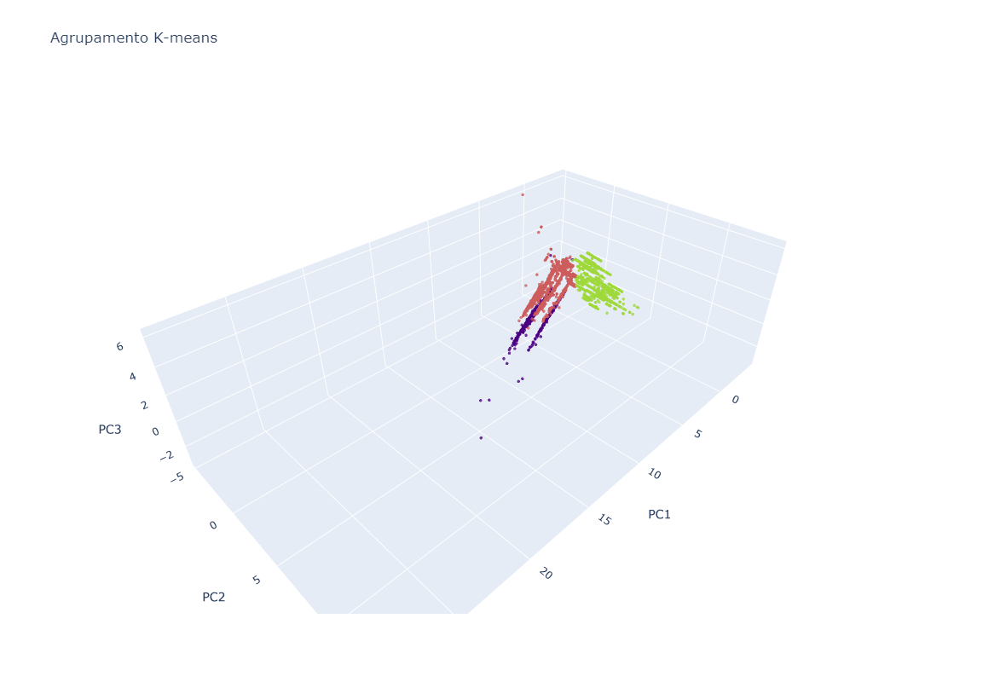

In [214]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>  '''))
  init_notebook_mode(connected=False)
  
  
from plotly.offline import init_notebook_mode
enable_plotly_in_cell()
init_notebook_mode(connected=False)

import plotly.offline as py
import plotly.graph_objs as go

trace1 = go.Scatter3d(
    x=grupos_df_3d["PC1"],
    y=grupos_df_3d["PC2"],
    z=grupos_df_3d["PC3"],
    mode='markers',
    text=kmeans.labels_,
    marker=dict(
        size=2,
        color=kmeans.labels_,         
        colorscale=[[0.0,"indianred"],[0.2,"darkorange"],[0.4,"yellow"],[0.6,"mediumseagreen"],[0.8,"skyblue"],[1.0, "indigo"]],
        opacity=0.8
    )
)

data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="Agrupamento K-means",
    scene = dict(
        xaxis = dict(title="PC1"),
        yaxis = dict(title="PC2"),
        zaxis = dict(title="PC3")
    ),
    width=800,
    height=800
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

## Analisando os grupos com a métrica de silhueta
<hr style="border:2px solid #0077b9;">

A métrica de silhueta se refere a um método de interpretação e validação de consistência dentro de grupos. O valor da silhueta é uma medida de quão semelhante um objeto é ao seu próprio cluster (coesão) em comparação com outros clusters (separação). Ele pode ser usado para estudar a distância de separação entre os clusters resultantes. O gráfico de silhueta exibe uma medida de quão próximo cada ponto em um cluster está de pontos nos clusters vizinhos e, portanto, fornece uma maneira de avaliar parâmetros como o número de clusters visualmente.

In [215]:
pip install yellowbrick

Note: you may need to restart the kernel to use updated packages.


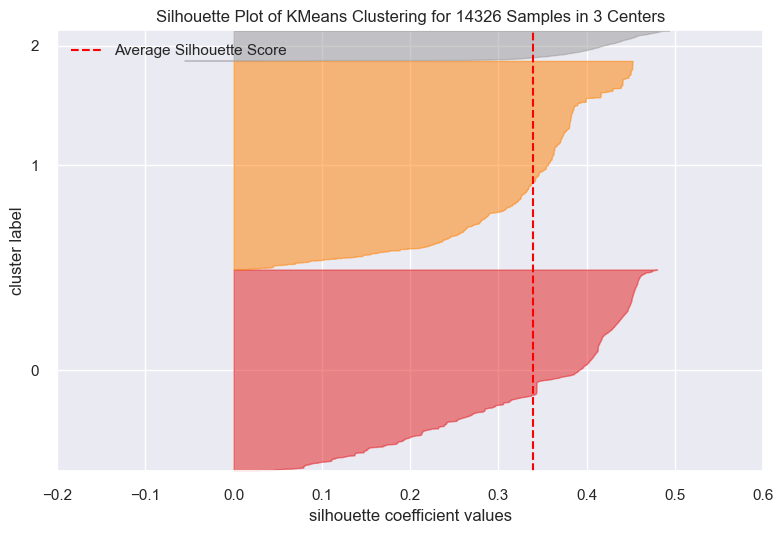

In [216]:
# Vamos utilizar o método que está disponível na biblioteca yellowbrick
# chamado SilhouetteVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer

n_clusters = 3 # Número de grupos que escolhemos
sil = SilhouetteVisualizer(KMeans(n_clusters)) # Método SilhouetteVisualizer
sil.fit(df_std)
sil.finalize()
plt.tight_layout()
plt.show()

## Agrupamento Hierárquico
<hr style="border:2px solid #0077b9;">

Uma função para nos ajudar a plotar o dendograma:

In [217]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, **kwargs)

Utilizando o agrupamento acumulativo da scikit:

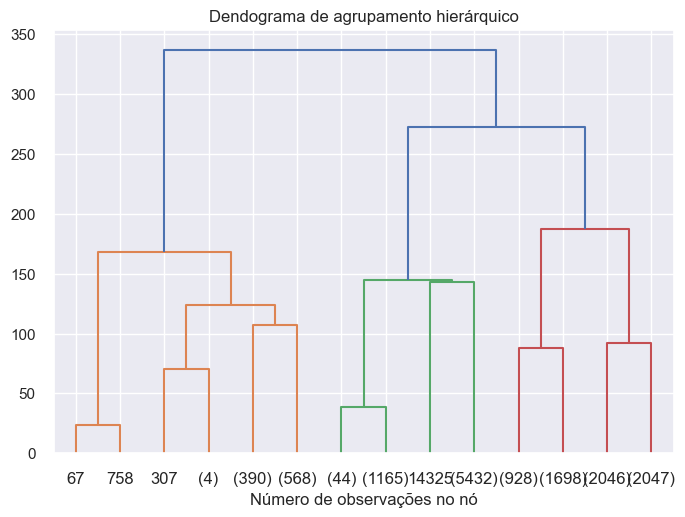

In [218]:
# Consultar a scikit para encontrar o método de agrupamento acumulativo
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

dend = AgglomerativeClustering(distance_threshold=0, n_clusters= None) # Chamada do método
dend = dend.fit(df_std)
plt.title("Dendograma de agrupamento hierárquico")
plot_dendrogram(dend, truncate_mode="level", p=3)
plt.xlabel("Número de observações no nó")
plt.show()